In [33]:
import os
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [34]:
# Set Base Path and Load Battery Data
eis_base_path = "/kaggle/input/eis-capacity/EIS data"
capacity_base_path = "/kaggle/input/eis-capacity/Capacity data"

temperatures = [25, 35, 45]
batteries_no = [
    [i for i in range(1, 9)],
    [1, 2],
    [1, 2],
]

class Battery:
    def __init__(self, name, df, temperature):
        self.name = name
        self.df = df
        self.temperature = temperature

    def __str__(self):
        return self.name

battery_data : list[Battery] = []
batteries : list[str] = []

In [35]:
def load_capacity_data(base_path, battery_name):
    fpath = os.path.join(base_path, f"Data_Capacity_{battery_name}" + '.txt')
    try:
        print(f"Loading capacity data for {battery_name}...")

        df = pd.read_csv(fpath, sep='\t')
        df.columns = df.columns.str.strip()
        df['cycle number'] = pd.to_numeric(df['cycle number'], errors='coerce')
        df['capacity'] = pd.to_numeric(df['Capacity/mA.h'], errors='coerce')
        df = df.dropna(subset=['cycle number', 'capacity'])

        # Transform cycle number and filter
        df['cycle number'] = df['cycle number'] * 2
        df = df[df['cycle number'] <= 500]

        # Take the last capacity of each cycle
        df = df[df['ox/red'] == 0]
        grouped = df.groupby('cycle number', as_index=False).last()

        first_cycle = grouped['cycle number'].min()
        init_cap = grouped[grouped['cycle number'] == first_cycle]['capacity'].max()
        # Calculate cycle at which capacity falls below 80% of initial capacity
        threshold = 0.8 * init_cap
        below_80 = grouped[grouped['capacity'] < threshold]

        if battery_name == '25C04':
            # From https://arxiv.org/pdf/2408.03469
            cycle_80 = 114
        elif not below_80.empty:
            cycle_80 = below_80['cycle number'].iloc[0]
        else:
            cycle_80  = grouped['cycle number'].max()

        grouped.rename(columns={'cycle number': 'cycle'}, inplace=True)

        return grouped, cycle_80

    except FileNotFoundError:
        print(f"{battery_name}: File not found.")

Loading capacity data for 25C01...


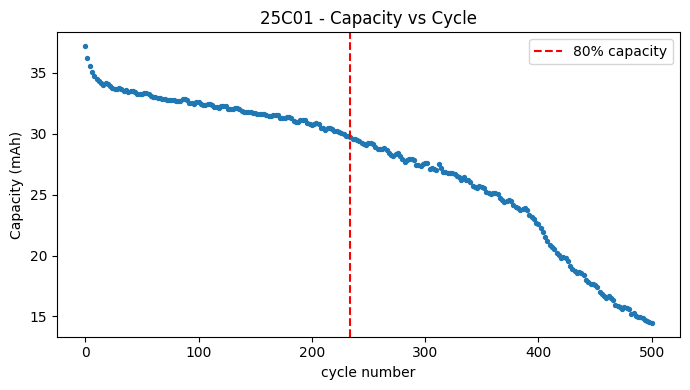

Loaded EIS_state_V_25C01.txt:  7080 rows, EOL cycles: 234.0
Loading capacity data for 25C02...


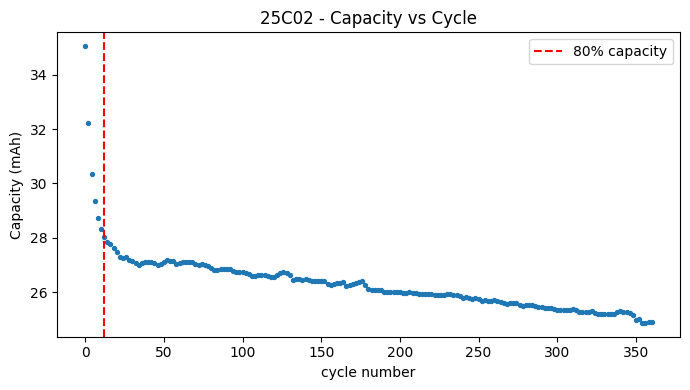

Loaded EIS_state_V_25C02.txt:   420 rows, EOL cycles:  12.0
Loading capacity data for 25C03...


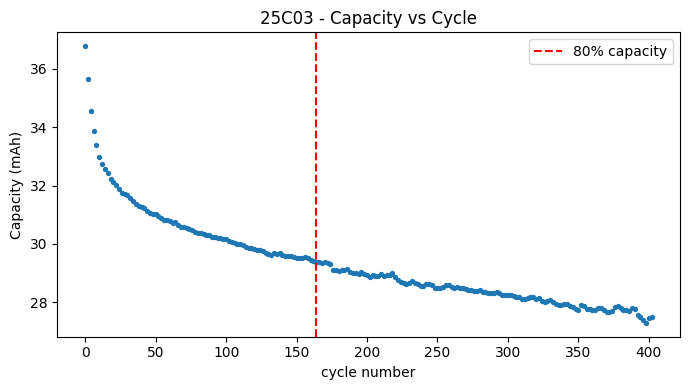

Loaded EIS_state_V_25C03.txt:  4980 rows, EOL cycles: 164.0
Loading capacity data for 25C04...


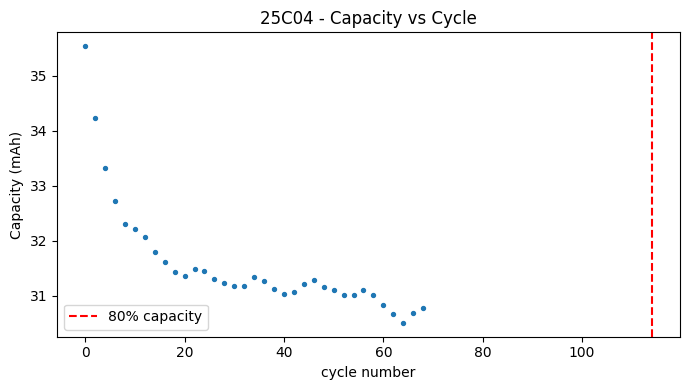

Loaded EIS_state_V_25C04.txt:  3480 rows, EOL cycles: 114.0
Loading capacity data for 25C05...


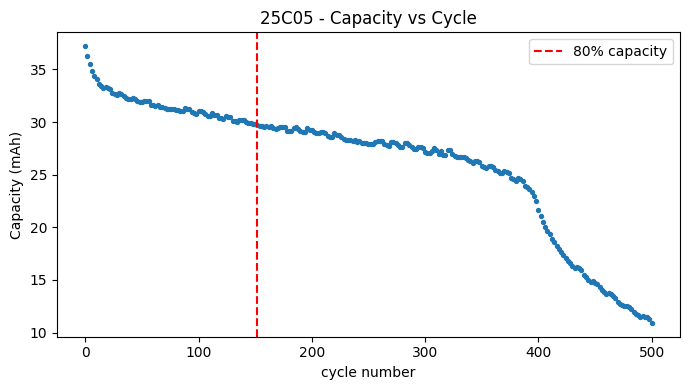

Loaded EIS_state_V_25C05.txt:  4620 rows, EOL cycles: 152.0
Loading capacity data for 25C06...


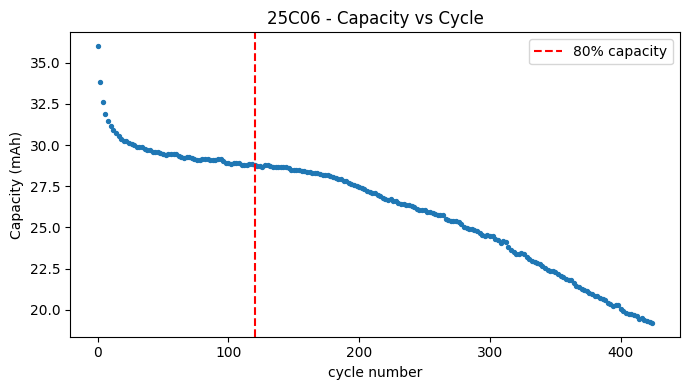

Loaded EIS_state_V_25C06.txt:  3660 rows, EOL cycles: 120.0
Loading capacity data for 25C07...


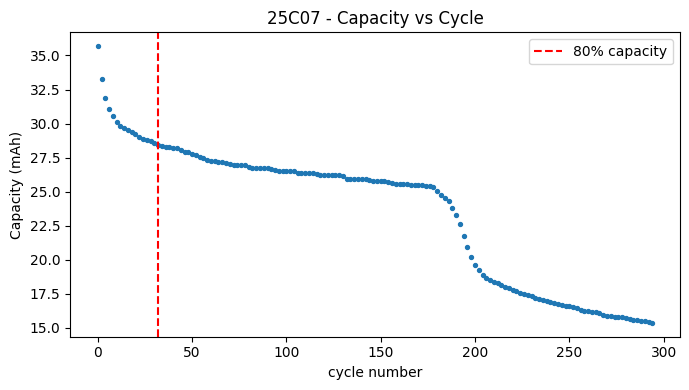

Loaded EIS_state_V_25C07.txt:  1020 rows, EOL cycles:  32.0
Loading capacity data for 25C08...


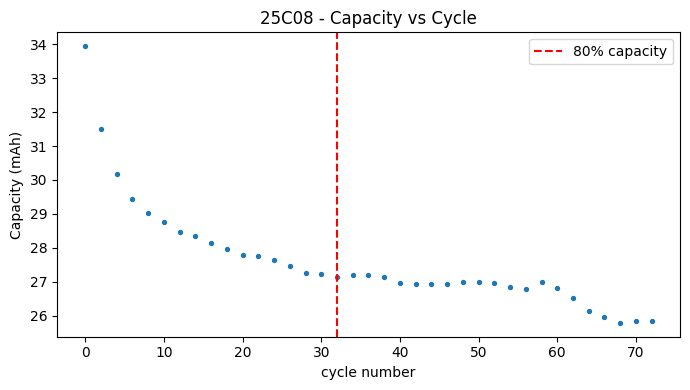

Loaded EIS_state_V_25C08.txt:  1020 rows, EOL cycles:  32.0
Loading capacity data for 35C01...


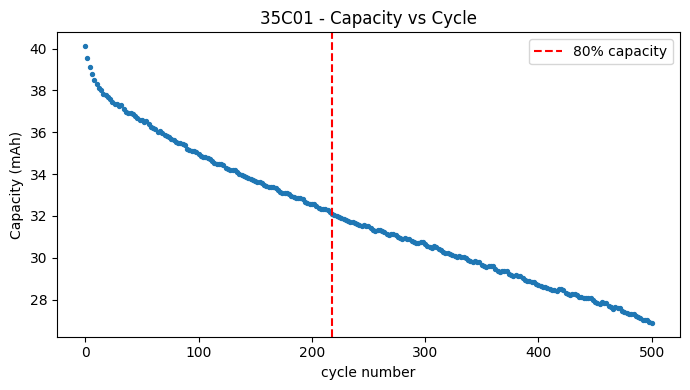

Loaded EIS_state_V_35C01.txt:  6600 rows, EOL cycles: 218.0
Loading capacity data for 35C02...


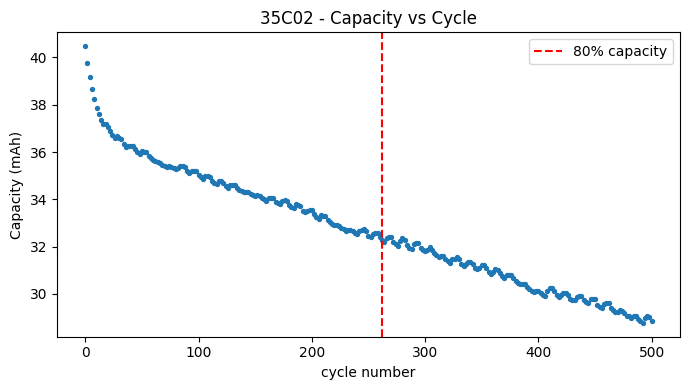

Loaded EIS_state_V_35C02.txt:  7920 rows, EOL cycles: 262.0
Loading capacity data for 45C01...


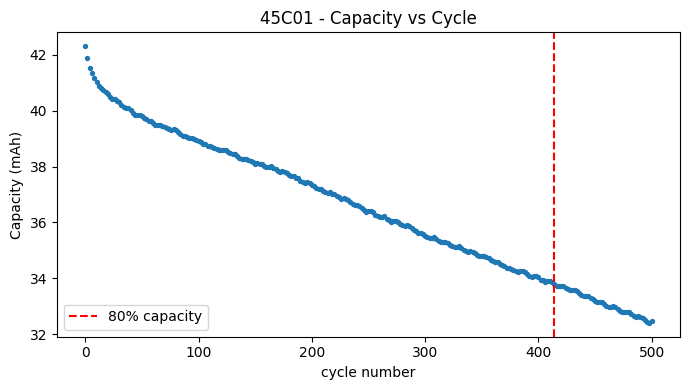

Loaded EIS_state_V_45C01.txt: 12480 rows, EOL cycles: 414.0
Loading capacity data for 45C02...


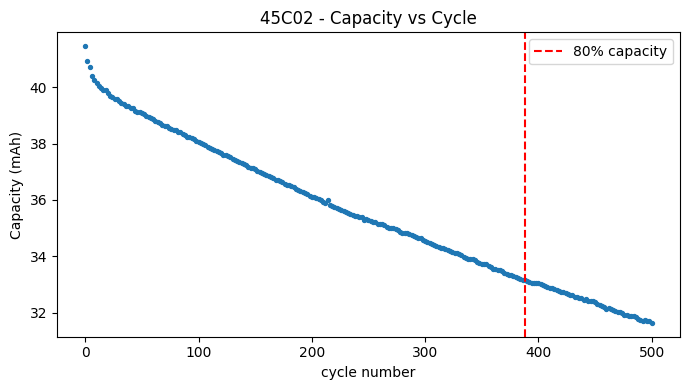

Loaded EIS_state_V_45C02.txt: 11700 rows, EOL cycles: 388.0

Loaded 12 battery datasets


In [36]:
# Load data for each battery
battery_data.clear()
batteries.clear()
for temperature, batteries_number in zip(temperatures, batteries_no):
    for battery in batteries_number:
        # Read file
        battery_name = f"{temperature}C{battery:02d}"
        EIS_filename = f"EIS_state_V_{battery_name}.txt"

        batteries.append(battery_name)
        EIS_file_path = os.path.join(eis_base_path, EIS_filename)

        if temperature == 25:
            df = pd.read_csv(EIS_file_path, sep='\t') # Tab-delimited file
            df.columns = df.columns.str.strip() # Strip whitespace from column names

            # rename the columns
            df.rename(columns={'cycle number': 'cycle'}, inplace=True)
            df.rename(columns={'freq/Hz': 'frequency'}, inplace=True)
            df.rename(columns={'Re(Z)/Ohm': 'eis_real'}, inplace=True)
            df.rename(columns={'-Im(Z)/Ohm': 'eis_imag'}, inplace=True)

        else:
            df = pd.read_csv(EIS_file_path, sep='\t', header=None) # Tab-delimited file without header
            # Add header
            df.columns = ['time/s', 'cycle', 'frequency', 'eis_real', 'eis_imag', '|Z|/Ohm', 'Phase(Z)/deg']

        # Multiply cycle number by 2 because the measurements are taken in even-numbered cycles
        df['cycle'] = (df['cycle'] - 1) * 2

        # get capacity data and end of life (EOL)
        capacity_df, eol = load_capacity_data(capacity_base_path, battery_name)
        if eol is None:
            eol = df['cycle'].max()  # If no EOL found, use max cycle in EIS data
        
        plt.figure(figsize=(7, 4))
        plt.scatter(capacity_df['cycle'], capacity_df['capacity'], s=8)
        if eol is not None:
            plt.axvline(x=eol, color='red', linestyle='--', label='80% capacity')
            plt.legend()
        plt.title(f'{battery_name} - Capacity vs Cycle')
        plt.xlabel('cycle number')
        plt.ylabel('Capacity (mAh)')
        plt.tight_layout()
        plt.show()

        # Calculate Remaining Useful Life
        df['RUL'] = eol - df['cycle']
        # drop rows with negative or zero RUL
        df = df[df['RUL'] >= 0]
        df['temperature'] = temperature
        df['battery'] = battery_name
        # append capacity data
        df = pd.merge(df, capacity_df[['cycle', 'capacity']], on='cycle', how='left')

        battery_data.append(Battery(battery_name, df, temperature)) # Append battery data
        print(f"Loaded {EIS_filename}: {len(df):>5} rows, EOL cycles: {df['cycle'].max():>5}")

print(f"\nLoaded {len(battery_data)} battery datasets")

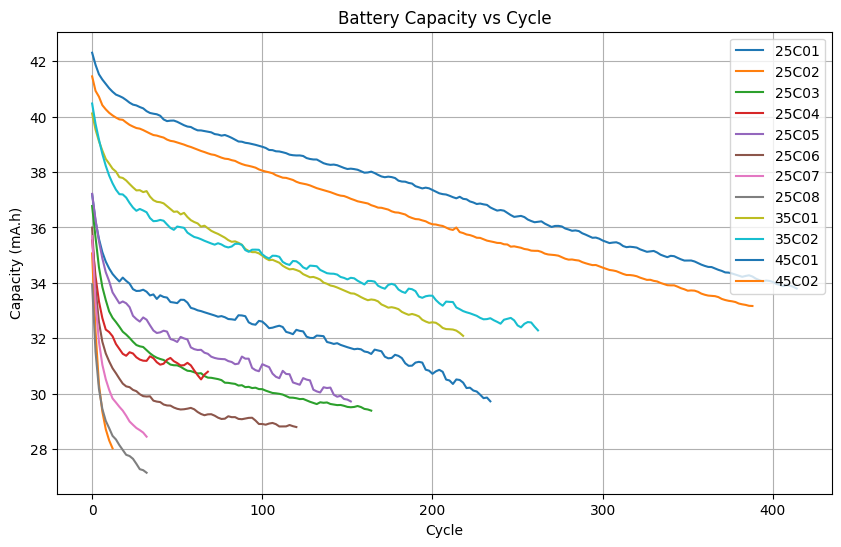

In [37]:
# Plot capacity vs cycle for all batteries
plt.figure(figsize=(10, 6))
for battery in battery_data:
    df = battery.df
    plt.plot(df['cycle'], df['capacity'], label=battery.name)

plt.xlabel('Cycle')
plt.ylabel('Capacity (mA.h)')
plt.title('Battery Capacity vs Cycle')
plt.legend()
plt.grid()
plt.show()

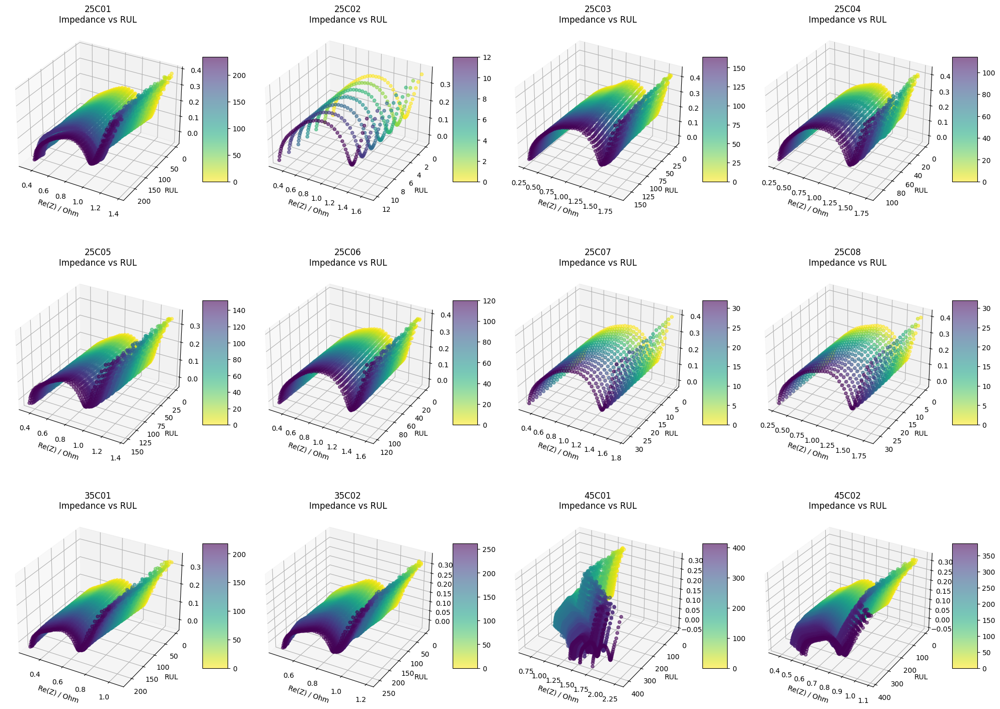

In [38]:
fig = plt.figure(figsize=(20, 15))

plot_num = 1
for battery in battery_data:
    ax = fig.add_subplot(3, 4, plot_num, projection='3d')
    
    # Create 3D scatter plot
    scatter = ax.scatter(battery.df['eis_real'], battery.df['RUL'], battery.df['eis_imag'],
                         c=battery.df['RUL'], cmap='viridis_r', alpha=0.6)
    
    ax.set_xlabel('Re(Z) / Ohm')
    ax.set_zlabel('-Im(Z) / Ohm')
    ax.set_ylabel('RUL')
    ax.set_title(f'{battery.name}\nImpedance vs RUL')
    
    # Add colorbar
    plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)

    ax.invert_yaxis()
    
    plot_num += 1

plt.tight_layout()
plt.show()

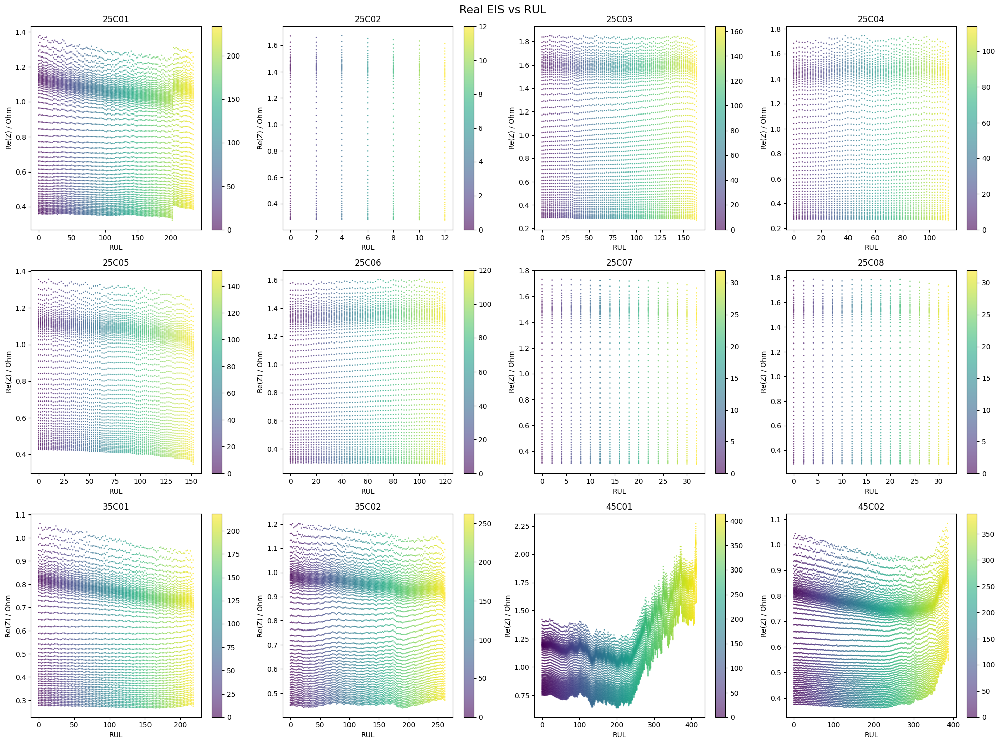

In [39]:
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('Real EIS vs RUL', fontsize=16)

plot_idx = 0
for i in range(3):
    for j in range(4):
        if plot_idx < len(battery_data):
            battery = battery_data[plot_idx]
            
            scatter = axes[i, j].scatter(battery.df['RUL'], battery.df['eis_real'], 
                                       c=battery.df['RUL'], cmap='viridis', alpha=0.6, s=1)
            
            axes[i, j].set_xlabel('RUL')
            axes[i, j].set_ylabel('Re(Z) / Ohm')
            axes[i, j].set_title(f'{battery.name}')
            
            plt.colorbar(scatter, ax=axes[i, j])
            
            plot_idx += 1
        else:
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()

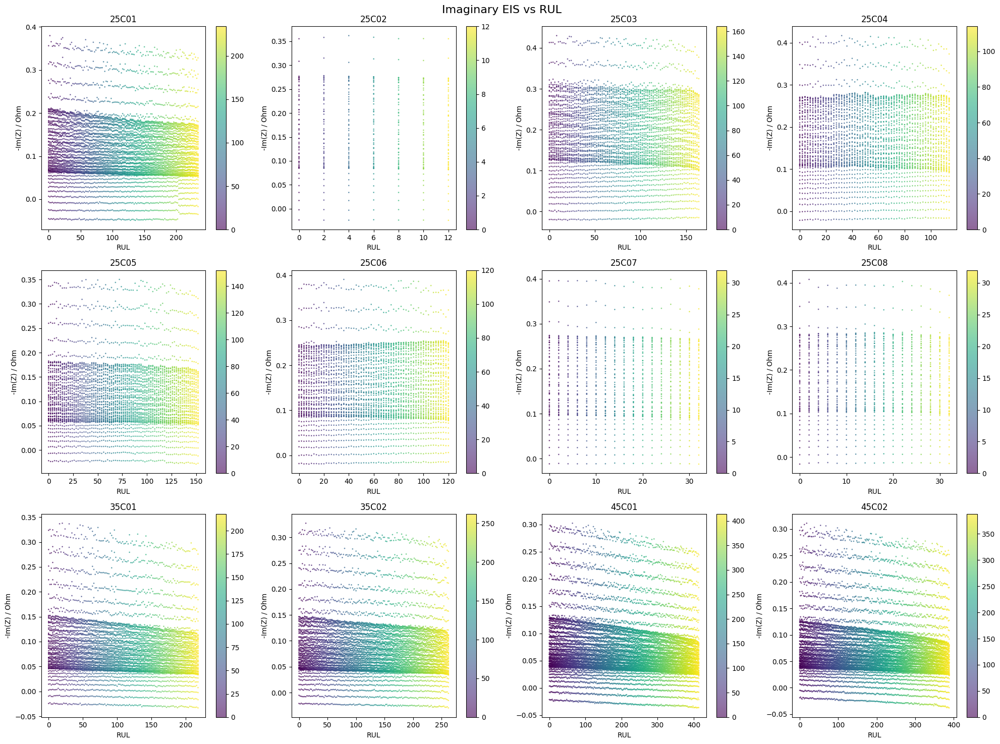

In [40]:
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('Imaginary EIS vs RUL', fontsize=16)

plot_idx = 0
for i in range(3):
    for j in range(4):
        if plot_idx < len(battery_data):
            battery = battery_data[plot_idx]
            
            scatter = axes[i, j].scatter(battery.df['RUL'], battery.df['eis_imag'], 
                                       c=battery.df['RUL'], cmap='viridis', alpha=0.6, s=1)

            axes[i, j].set_xlabel('RUL')
            axes[i, j].set_ylabel('-Im(Z) / Ohm')
            axes[i, j].set_title(f'{battery.name}')
            
            plt.colorbar(scatter, ax=axes[i, j])
            
            plot_idx += 1
        else:
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()

In [48]:
battery_dataset = {}
corr_data = []

for battery in battery_data:
    pivot_table = battery.df.pivot_table(
        index='RUL',
        columns='frequency', 
        values=['eis_real', 'eis_imag'],
    )

    # Rename columns
    pivot_table.columns = [f"{col[0]}-{col[1]}" for col in pivot_table.columns]
    pivot_table = pivot_table.reset_index()

    # Save pivot table
    pivot_table.to_csv(f"{battery.name}.csv", index=False)
    battery_dataset[battery.name] = pivot_table
        
    # Correlation with RUL
    correlations = pivot_table.corrwith(pivot_table['RUL']).drop('RUL')
    for col, corr in correlations.items():
        if col.startswith("eis_real") or col.startswith("eis_imag"):
            freq = float(col.split("-")[-1])
            comp = "real" if "real" in col else "imag"
            corr_data.append([battery.name, freq, comp, corr])
    
corr_df = pd.DataFrame(corr_data, columns=["battery", "frequency", "component", "correlation"])

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


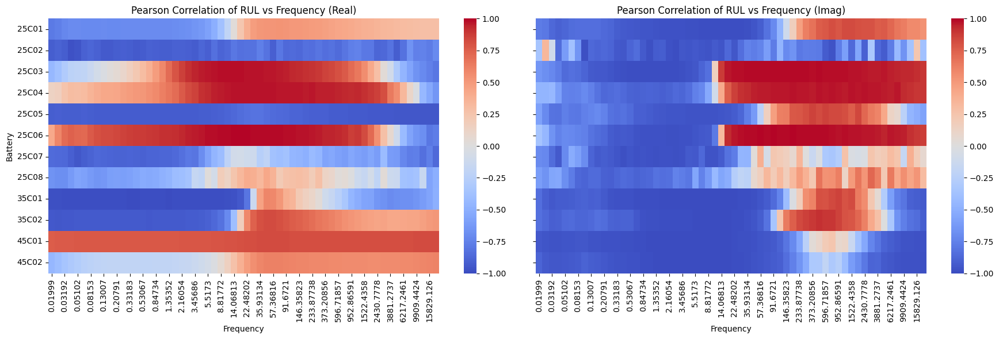

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Real
pivot_real = corr_df[corr_df["component"] == "real"].pivot_table(
    index="battery", columns="frequency", values="correlation"
)
sns.heatmap(pivot_real, cmap="coolwarm", center=0, vmin=-1, vmax=1, ax=axes[0])
axes[0].set_title("Pearson Correlation of RUL vs Frequency (Real)")
axes[0].set_ylabel("Battery")
axes[0].set_xlabel("Frequency")

# Imag
pivot_imag = corr_df[corr_df["component"] == "imag"].pivot_table(
    index="battery", columns="frequency", values="correlation"
)
sns.heatmap(pivot_imag, cmap="coolwarm", center=0, vmin=-1, vmax=1, ax=axes[1])
axes[1].set_title("Pearson Correlation of RUL vs Frequency (Imag)")
axes[1].set_ylabel("")
axes[1].set_xlabel("Frequency")

plt.tight_layout()
plt.show()

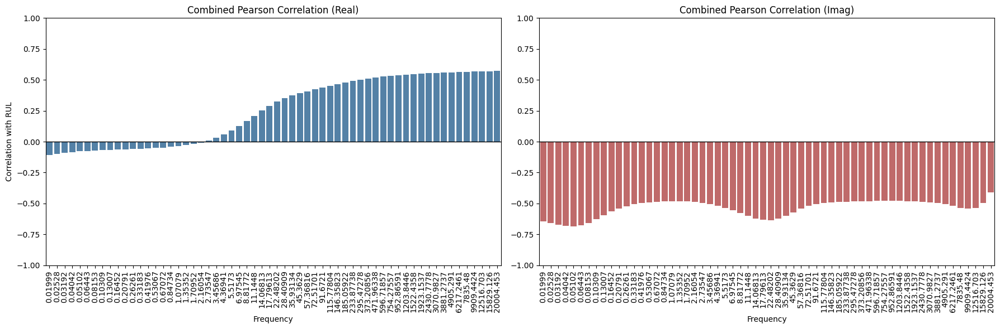

In [43]:
combined_df = pd.concat(battery_dataset.values(), ignore_index=True)
combined_corr = combined_df.corrwith(combined_df['RUL']).drop('RUL')

combined_data = []
for col, corr in combined_corr.items():
    if col.startswith("eis_real") or col.startswith("eis_imag"):
        freq = float(col.split("-")[-1])
        comp = "real" if "real" in col else "imag"
        combined_data.append([freq, comp, corr])

combined_corr_df = pd.DataFrame(combined_data, columns=["frequency", "component", "correlation"])

# === Plot as bar graph ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Real component
real_corr = combined_corr_df[combined_corr_df["component"] == "real"]
sns.barplot(data=real_corr, x="frequency", y="correlation", color="steelblue", ax=axes[0])
axes[0].set_title("Combined Pearson Correlation (Real)")
axes[0].set_xlabel("Frequency")
axes[0].set_ylabel("Correlation with RUL")
axes[0].axhline(0, color="black", linewidth=1)
axes[0].tick_params(axis='x', rotation=90)
axes[0].set_ylim(-1, 1)

# Imag component
imag_corr = combined_corr_df[combined_corr_df["component"] == "imag"]
sns.barplot(data=imag_corr, x="frequency", y="correlation", color="indianred", ax=axes[1])
axes[1].set_title("Combined Pearson Correlation (Imag)")
axes[1].set_xlabel("Frequency")
axes[1].set_ylabel("")
axes[1].axhline(0, color="black", linewidth=1)
axes[1].tick_params(axis='x', rotation=90)
axes[1].set_ylim(-1, 1)

plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


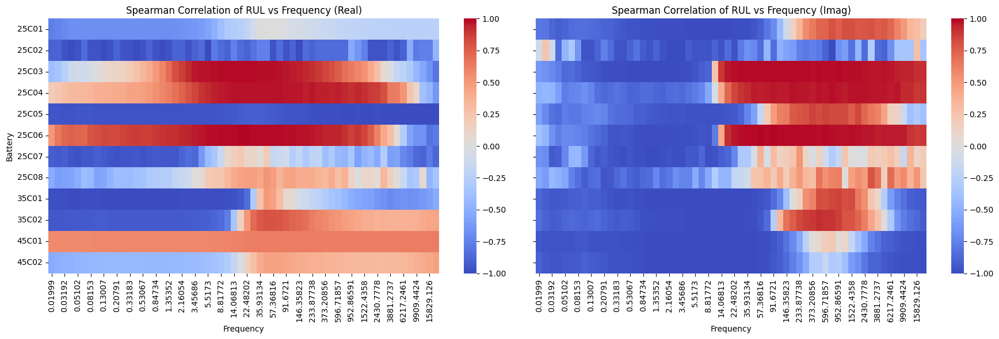

In [44]:
corr_data = []

# Loop through each battery dataset
for battery_name, df in battery_dataset.items():
    # Compute Spearman correlation with RUL
    correlations = df.corrwith(df['RUL'], method="spearman").drop('RUL')
    
    # Extract frequency from column name
    for col, corr in correlations.items():
        if col.startswith("eis_real") or col.startswith("eis_imag"):
            freq = float(col.split("-")[-1])
            comp = "real" if "real" in col else "imag"
            corr_data.append([battery_name, freq, comp, corr])

# Convert to DataFrame
corr_df = pd.DataFrame(corr_data, columns=["battery", "frequency", "component", "correlation"])

# === Plot Spearman correlation heatmaps ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Real
pivot_real = corr_df[corr_df["component"] == "real"].pivot_table(
    index="battery", columns="frequency", values="correlation"
)
sns.heatmap(pivot_real, cmap="coolwarm", center=0, vmin=-1, vmax=1, ax=axes[0])
axes[0].set_title("Spearman Correlation of RUL vs Frequency (Real)")
axes[0].set_ylabel("Battery")
axes[0].set_xlabel("Frequency")

# Imag
pivot_imag = corr_df[corr_df["component"] == "imag"].pivot_table(
    index="battery", columns="frequency", values="correlation"
)
sns.heatmap(pivot_imag, cmap="coolwarm", center=0, vmin=-1, vmax=1, ax=axes[1])
axes[1].set_title("Spearman Correlation of RUL vs Frequency (Imag)")
axes[1].set_ylabel("")
axes[1].set_xlabel("Frequency")

plt.tight_layout()
plt.show()

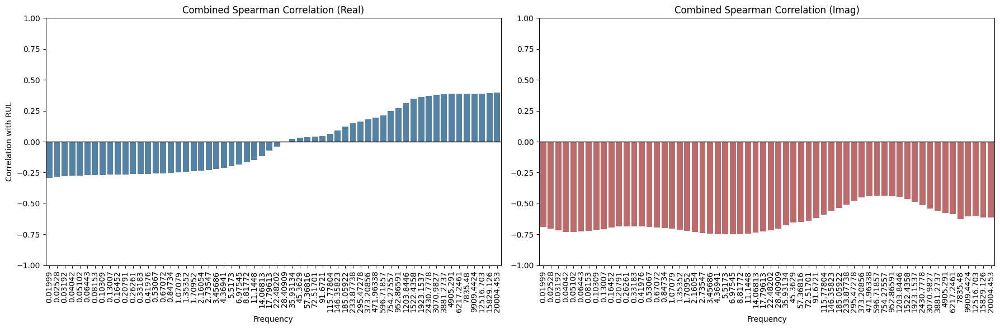

In [45]:
combined_df = pd.concat(battery_dataset.values(), ignore_index=True)
combined_corr = combined_df.corrwith(combined_df['RUL'], method="spearman").drop('RUL')

combined_data = []
for col, corr in combined_corr.items():
    if col.startswith("eis_real") or col.startswith("eis_imag"):
        freq = float(col.split("-")[-1])
        comp = "real" if "real" in col else "imag"
        combined_data.append([freq, comp, corr])

combined_corr_df = pd.DataFrame(combined_data, columns=["frequency", "component", "correlation"])

# === Plot as bar graph ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Real component
real_corr = combined_corr_df[combined_corr_df["component"] == "real"]
sns.barplot(data=real_corr, x="frequency", y="correlation", color="steelblue", ax=axes[0])
axes[0].set_title("Combined Spearman Correlation (Real)")
axes[0].set_xlabel("Frequency")
axes[0].set_ylabel("Correlation with RUL")
axes[0].axhline(0, color="black", linewidth=1)
axes[0].tick_params(axis='x', rotation=90)
axes[0].set_ylim(-1, 1)

# Imag component
imag_corr = combined_corr_df[combined_corr_df["component"] == "imag"]
sns.barplot(data=imag_corr, x="frequency", y="correlation", color="indianred", ax=axes[1])
axes[1].set_title("Combined Spearman Correlation (Imag)")
axes[1].set_xlabel("Frequency")
axes[1].set_ylabel("")
axes[1].axhline(0, color="black", linewidth=1)
axes[1].tick_params(axis='x', rotation=90)
axes[1].set_ylim(-1, 1)

plt.tight_layout()
plt.show()

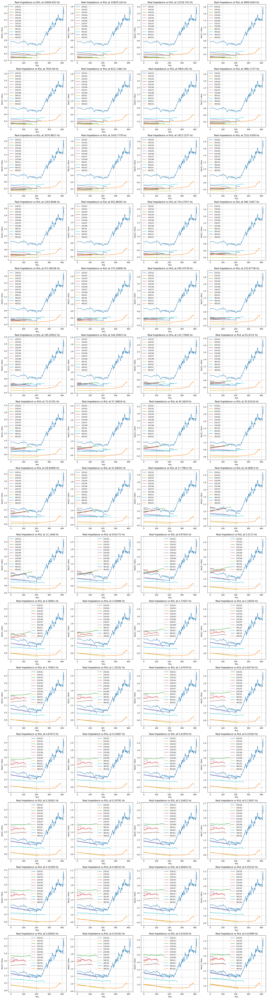

In [46]:
frequencies = battery_data[0].df['frequency'].unique()
num_freq = len(frequencies)
rows = (num_freq + 3) // 4
cols = 4
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), constrained_layout=True)
axes = axes.flatten()

for i, frequency in enumerate(frequencies):
    ax = axes[i]
    for battery in battery_data:
        subset = battery.df[battery.df['frequency'] == frequency]
        subset = subset.sort_values('RUL', ascending=False)
        ax.plot(subset['RUL'], subset['eis_real'], label=battery.name)
    
    ax.set_xlabel('RUL')
    ax.set_ylabel('Re(Z) / Ohm')
    ax.set_title(f'Real Impedance vs RUL at {frequency} Hz')
    ax.legend()
    ax.grid(True)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.show()

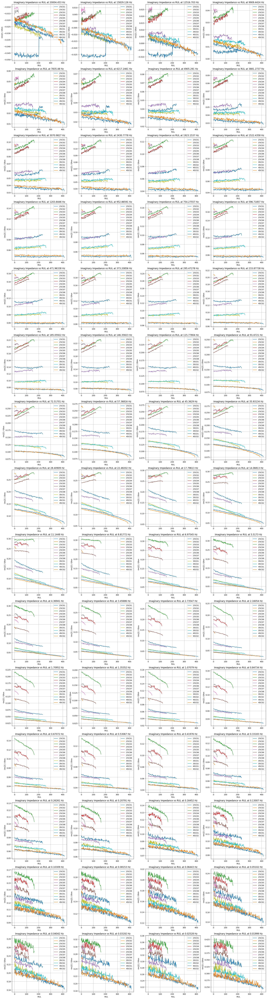

In [47]:
frequencies = battery_data[0].df['frequency'].unique()
num_freq = len(frequencies)
rows = (num_freq + 3) // 4
cols = 4
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), constrained_layout=True)
axes = axes.flatten()

for i, frequency in enumerate(frequencies):
    ax = axes[i]
    for battery in battery_data:
        subset = battery.df[battery.df['frequency'] == frequency]
        subset = subset.sort_values('RUL', ascending=False)
        ax.plot(subset['RUL'], subset['eis_imag'], label=battery.name)
    
    ax.set_xlabel('RUL')
    ax.set_ylabel('-Im(Z) / Ohm')
    ax.set_title(f'Imaginary Impedance vs RUL at {frequency} Hz')
    ax.legend()
    ax.grid(True)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.show()